# Retina Vessel Segmentation and Diabetes Classification

This notebook implements a diabetes classification system based on retina vessel segmentation using mathematical morphology techniques. The pipeline includes:
1. Image preprocessing using morphological operations (top-hat, etc.)
2. Vessel segmentation
3. Feature extraction
4. Deep Learning classification

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import cv2
from pathlib import Path
import os
from skimage.morphology import black_tophat, white_tophat, disk
from skimage.filters import median
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras import layers, models

# Set random seed for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

In [25]:
#lod 10 random images from dataset 
images_path = "./dataset/train/image"

def sample_loader(images_path,num_images=5):
    demo = []
    for i in range(num_images):
        img = np.random.choice(os.listdir(images_path))
        img_path = os.path.join(images_path, img)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        demo.append(img)
        
    return demo


In [21]:
def show_sample(demo):
    fig, axs = plt.subplots(1, len(demo), figsize=(15, 5))
    for i, img in enumerate(demo):
        axs[i].imshow(img)
        axs[i].axis('off')  
    plt.show()

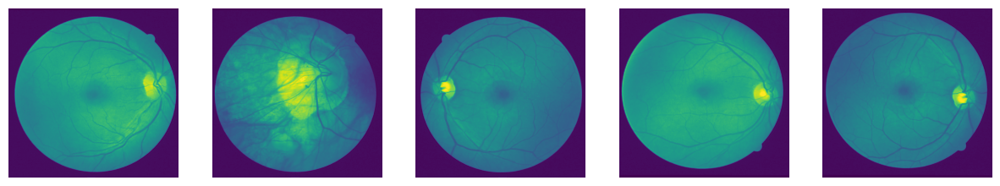

In [26]:
demo = sample_loader(images_path)
show_sample(demo)

In [9]:
# Basic morphological operations with visualization
from skimage.morphology import erosion, dilation, opening, closing, reconstruction
from skimage.filters import threshold_otsu
from skimage import img_as_ubyte

def display_comparison(original, transformed, titles=('Original', 'Transformed'), figsize=(10, 5)):
    """Helper function to display original and transformed images side by side."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    
    ax1.imshow(original, cmap='gray' if len(original.shape) == 2 else None)
    ax1.set_title(titles[0])
    ax1.axis('off')
    
    ax2.imshow(transformed, cmap='gray' if len(transformed.shape) == 2 else None)
    ax2.set_title(titles[1])
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()

def apply_basic_operations(img_rgb):
    """Apply basic morphological operations and show results."""
    # Convert to grayscale
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    
    # Create structuring elements
    square_selem = np.ones((5, 5), np.uint8)
    disk_selem = disk(5)
    
    # 1. Erosion
    eroded_square = erosion(gray, square_selem)
    display_comparison(gray, eroded_square, ('Original', 'Erosion (Square)'))
    
    eroded_disk = erosion(gray, disk_selem)
    display_comparison(gray, eroded_disk, ('Original', 'Erosion (Disk)'))
    
    # 2. Dilation
    dilated_square = dilation(gray, square_selem)
    display_comparison(gray, dilated_square, ('Original', 'Dilation (Square)'))
    
    dilated_disk = dilation(gray, disk_selem)
    display_comparison(gray, dilated_disk, ('Original', 'Dilation (Disk)'))
    
    # 3. Opening and Closing
    opened = opening(gray, disk_selem)
    display_comparison(gray, opened, ('Original', 'Opening'))
    
    closed = closing(gray, disk_selem)
    display_comparison(gray, closed, ('Original', 'Closing'))
    
    return {
        'gray': gray,
        'eroded_square': eroded_square,
        'eroded_disk': eroded_disk,
        'dilated_square': dilated_square,
        'dilated_disk': dilated_disk,
        'opened': opened,
        'closed': closed
    }

In [10]:
# Advanced morphological operations
def apply_advanced_operations(img_rgb):
    """Apply advanced morphological operations and show results."""
    # Convert to grayscale
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    
    # Create structuring element
    selem = disk(5)
    
    # 1. Top-hat and Black-hat transforms
    white_th = white_tophat(gray, selem)
    display_comparison(gray, white_th, ('Original', 'White Top-hat'))
    
    black_th = black_tophat(gray, selem)
    display_comparison(gray, black_th, ('Original', 'Black Top-hat'))
    
    # 2. Morphological Gradients
    dilated = dilation(gray, selem)
    eroded = erosion(gray, selem)
    
    internal_gradient = cv2.subtract(gray, eroded)
    display_comparison(gray, internal_gradient, ('Original', 'Internal Gradient'))
    
    external_gradient = cv2.subtract(dilated, gray)
    display_comparison(gray, external_gradient, ('Original', 'External Gradient'))
    
    morph_gradient = cv2.subtract(dilated, eroded)
    display_comparison(gray, morph_gradient, ('Original', 'Morphological Gradient'))
    
    # 3. Geodesic Operations
    # First binarize
    thresh = threshold_otsu(gray)
    binary = (gray > thresh).astype(np.uint8) * 255
    
    # Geodesic reconstruction
    seed = erosion(binary, selem)
    reconstructed = reconstruction(seed, binary, method='dilation')
    display_comparison(binary, reconstructed, ('Binary', 'Geodesic Reconstruction'))
    
    # 4. Reconstruction-based Opening/Closing
    eroded_marker = erosion(gray, selem)
    opening_by_reconstruction = reconstruction(eroded_marker, gray, method='dilation')
    display_comparison(gray, opening_by_reconstruction, ('Original', 'Opening by Reconstruction'))
    
    dilated_marker = dilation(gray, selem)
    closing_by_reconstruction = reconstruction(dilated_marker, gray, method='erosion')
    display_comparison(gray, closing_by_reconstruction, ('Original', 'Closing by Reconstruction'))
    
    return {
        'white_tophat': white_th,
        'black_tophat': black_th,
        'internal_gradient': internal_gradient,
        'external_gradient': external_gradient,
        'morph_gradient': morph_gradient,
        'reconstructed': reconstructed,
        'opening_by_reconstruction': opening_by_reconstruction,
        'closing_by_reconstruction': closing_by_reconstruction
    }

Applying morphological operations to sample images...

=== Processing image 1: 4a558a1cd243.png (class: Moderate) ===

1. Basic Morphological Operations:


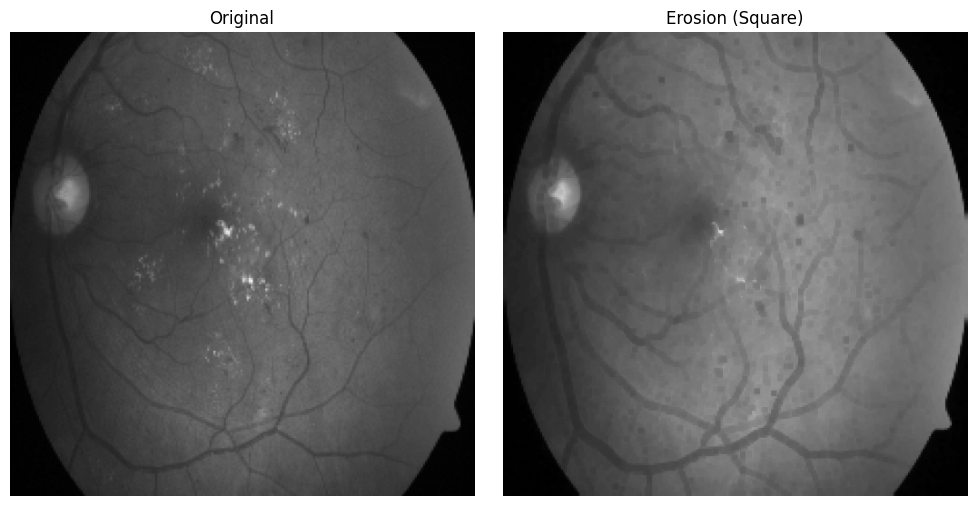

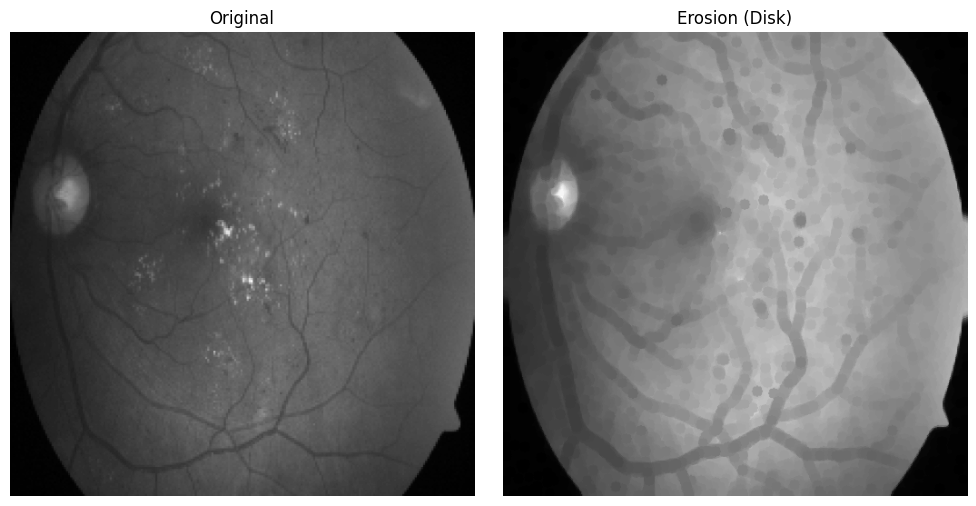

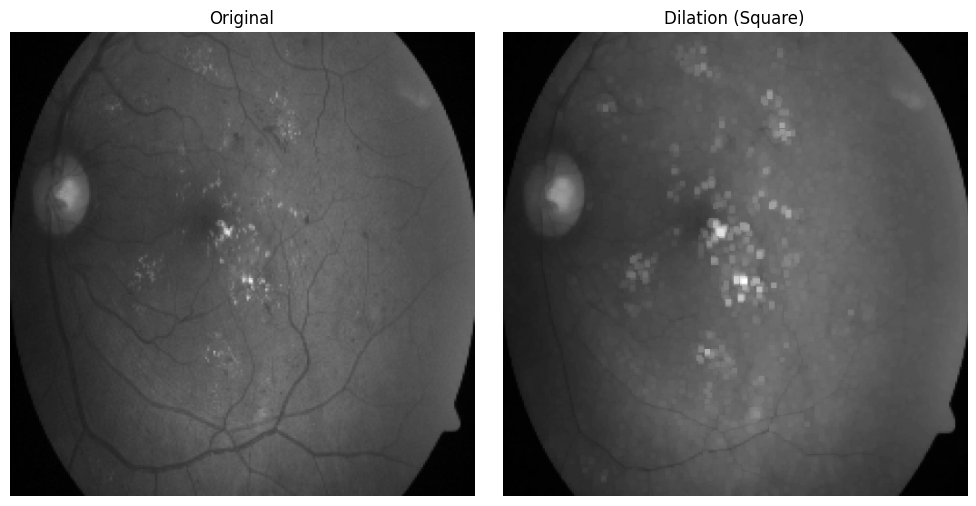

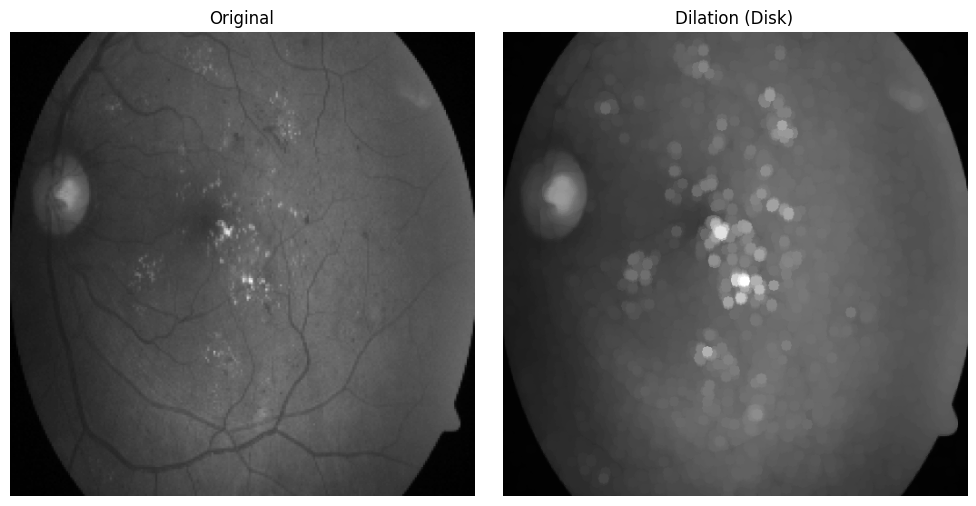

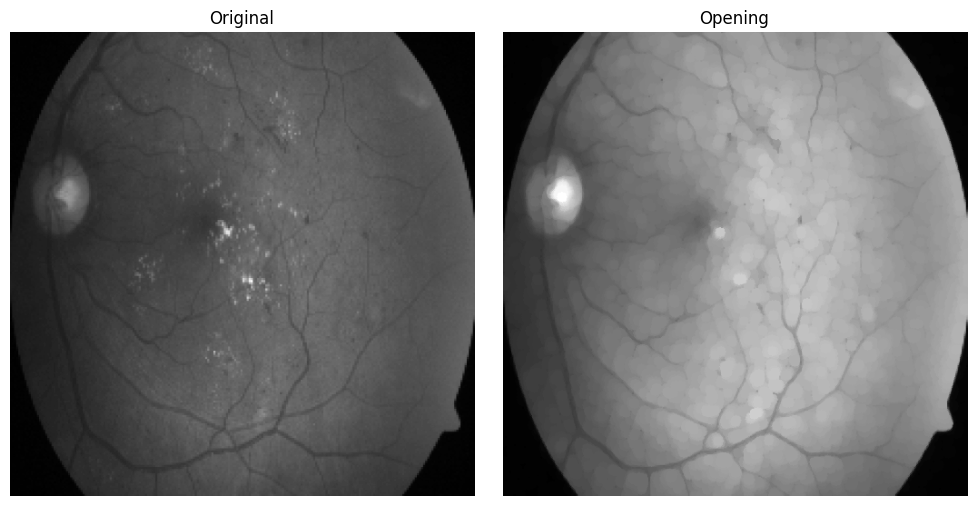

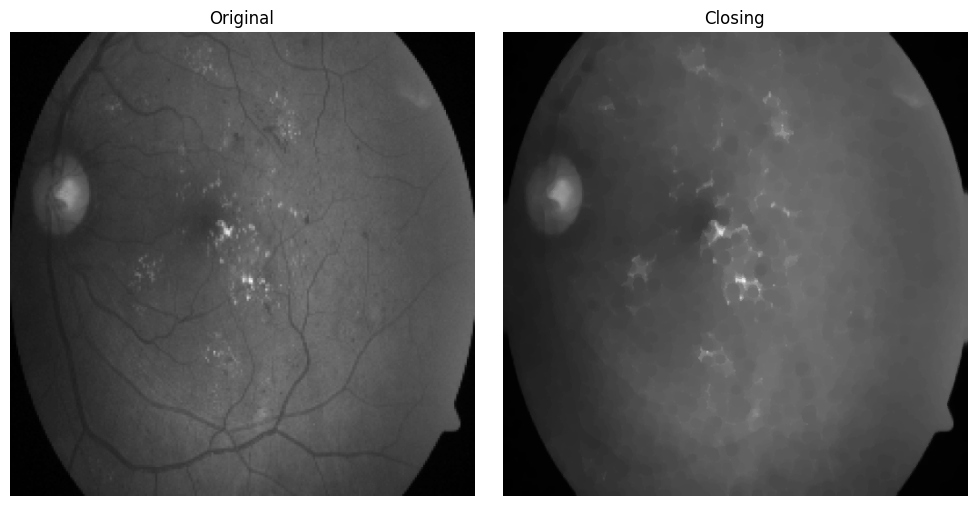


2. Advanced Morphological Operations:


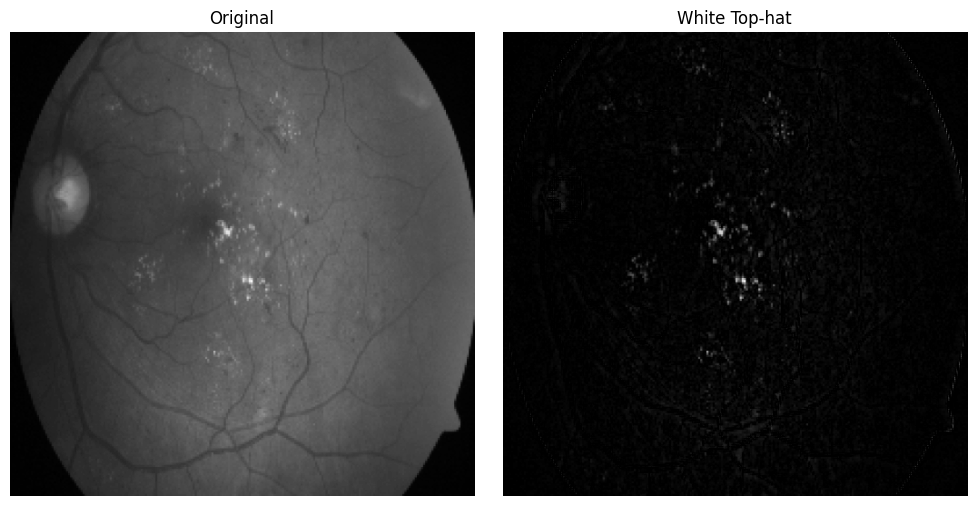

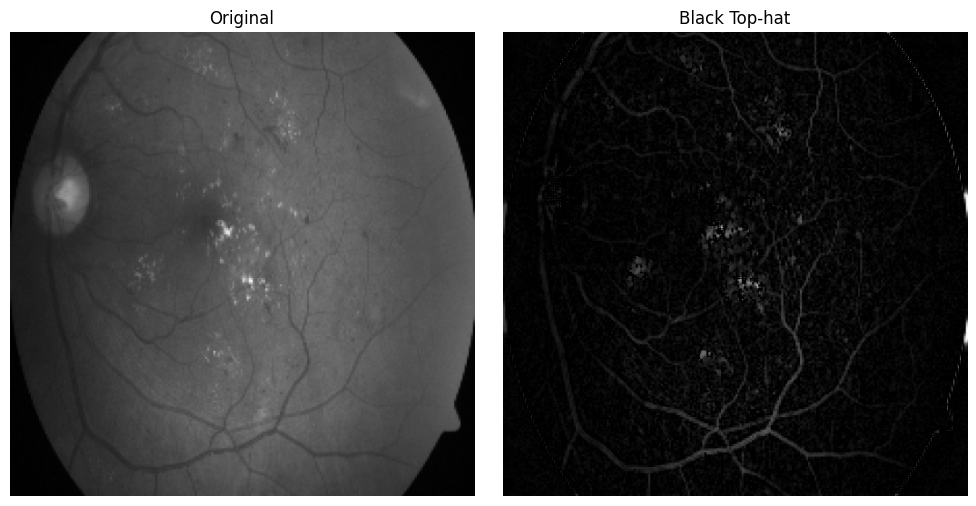

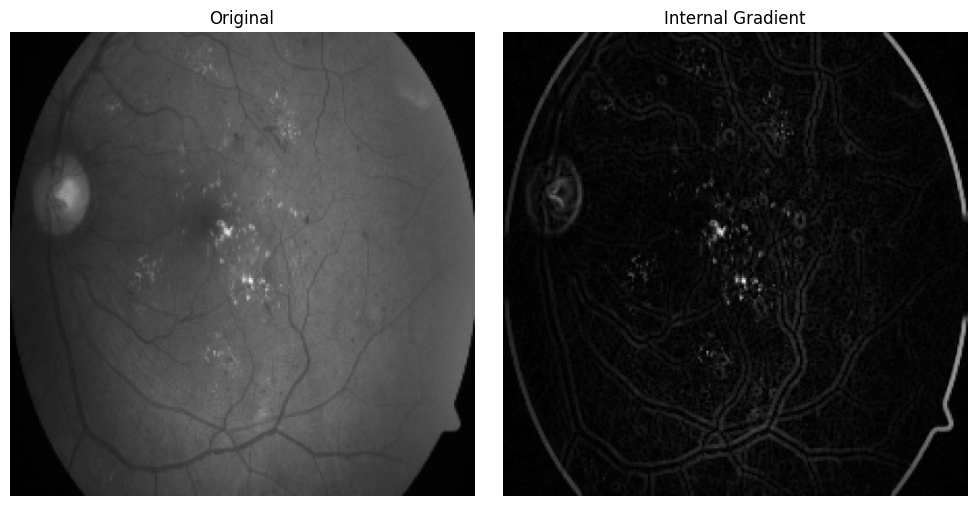

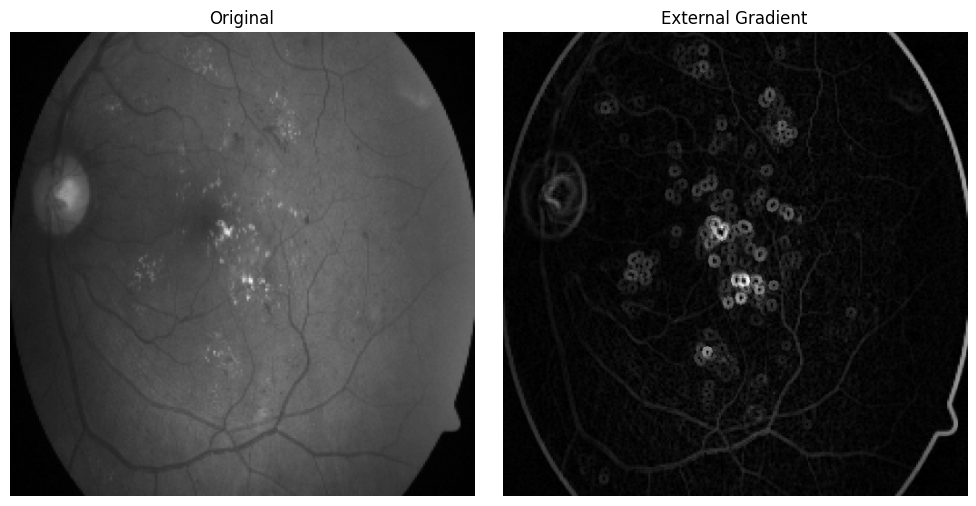

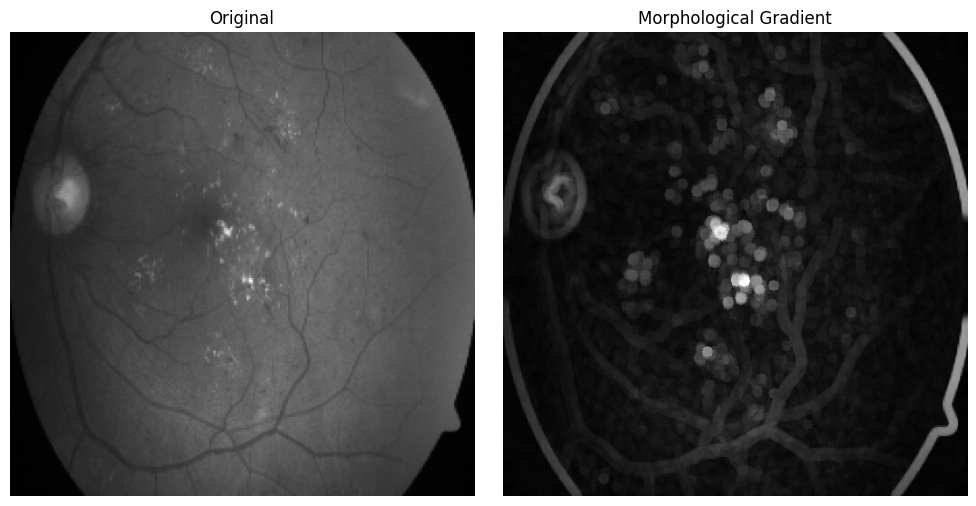

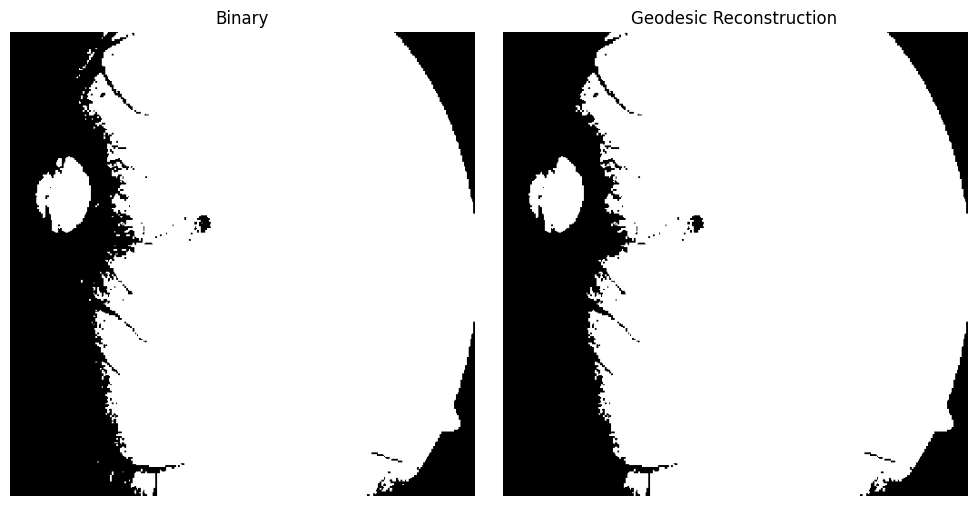

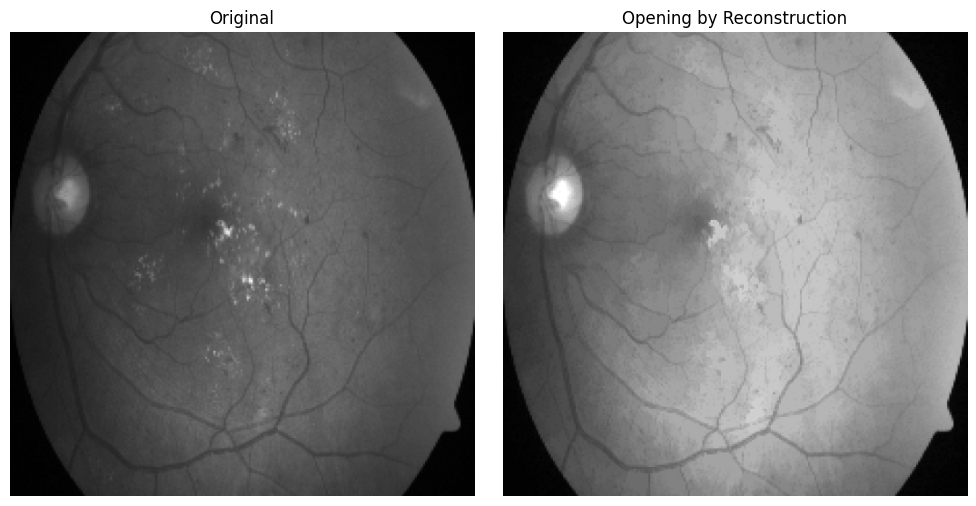

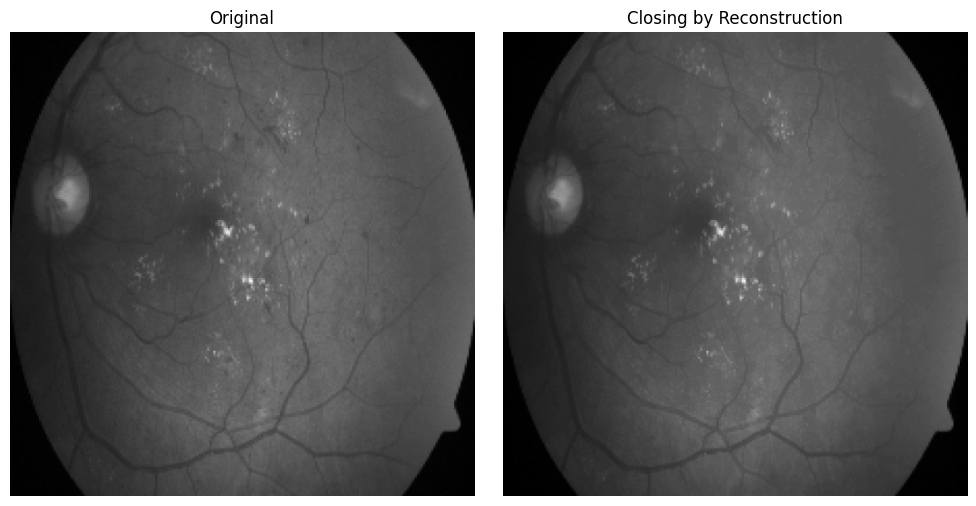

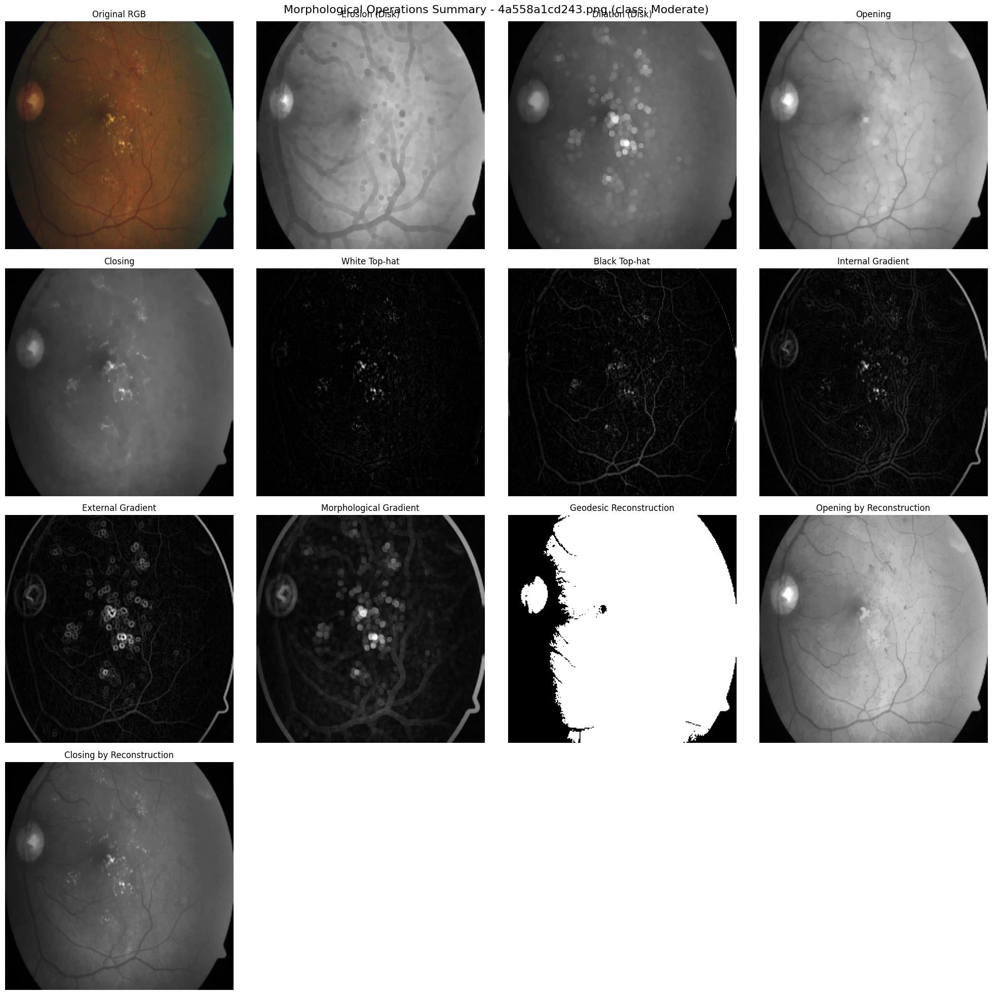


Processing complete for this image.

=== Processing image 2: 4c5ab774a381.png (class: No_DR) ===

1. Basic Morphological Operations:


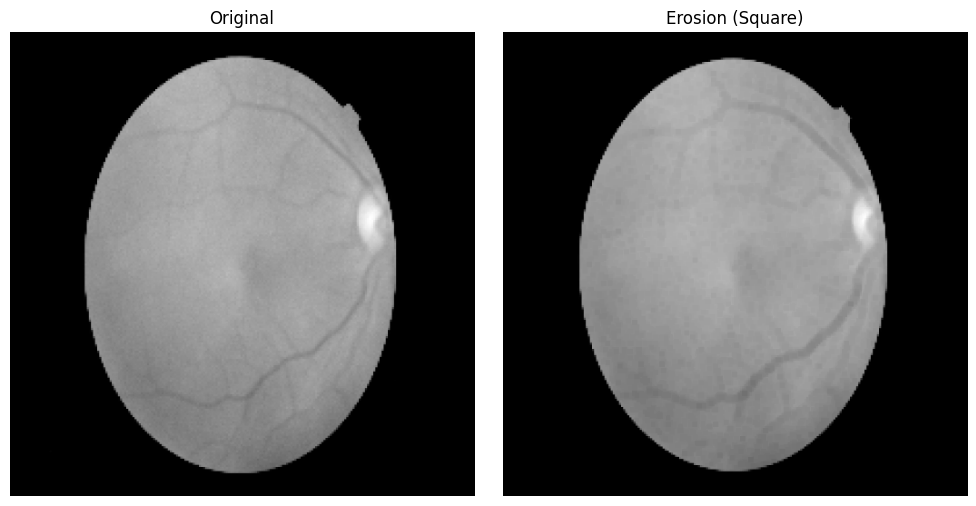

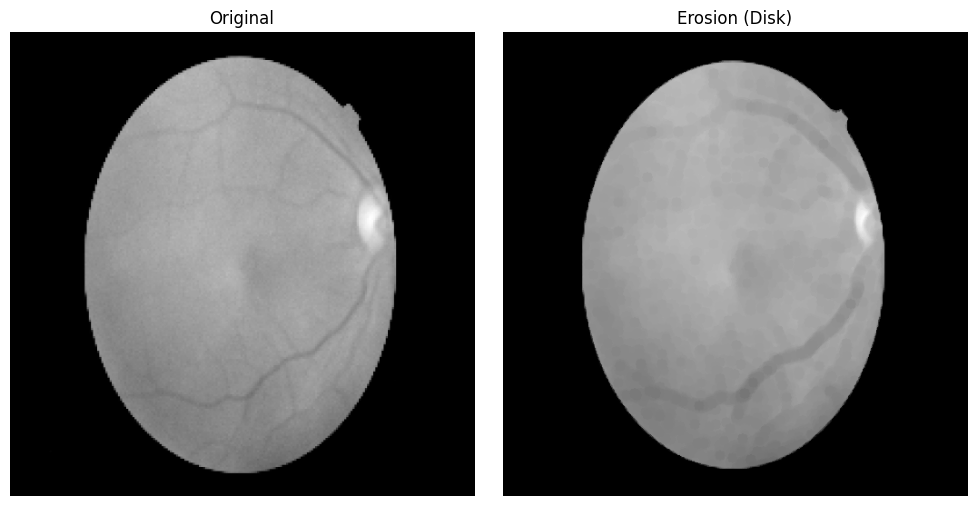

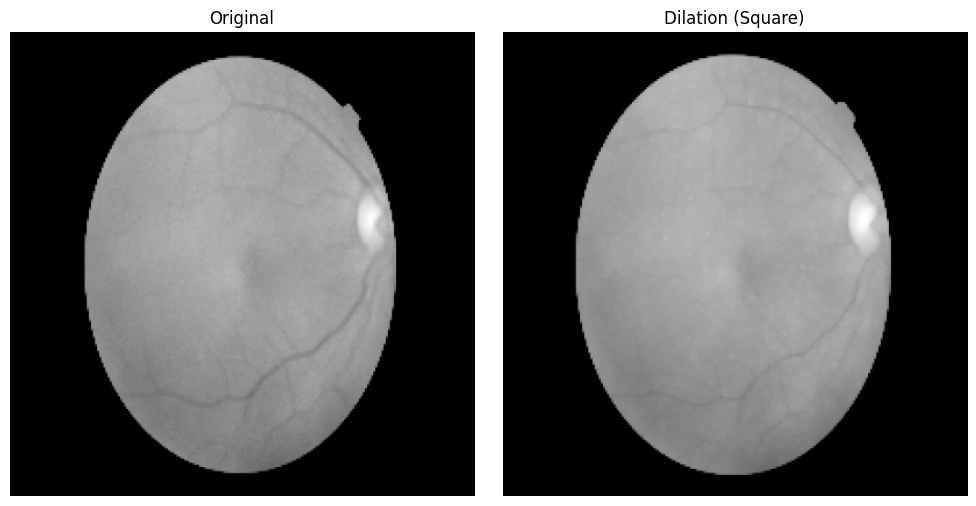

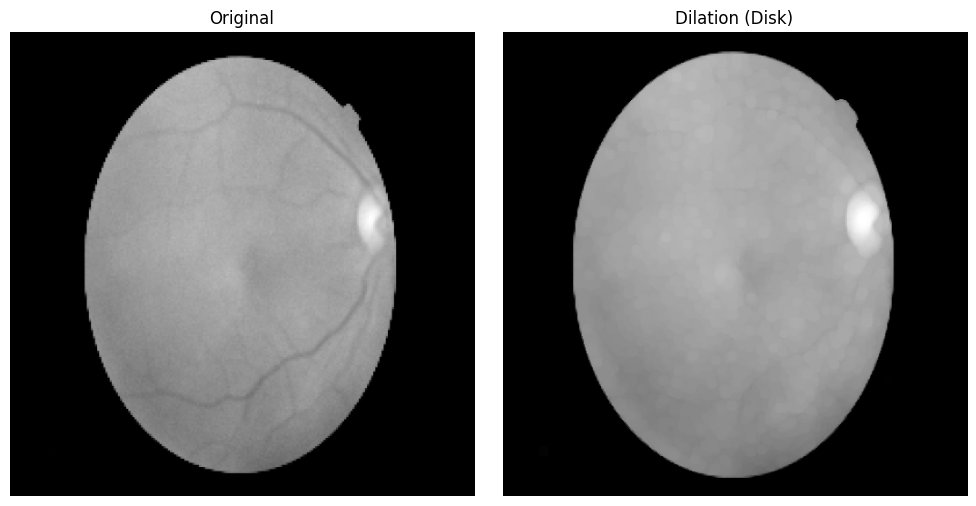

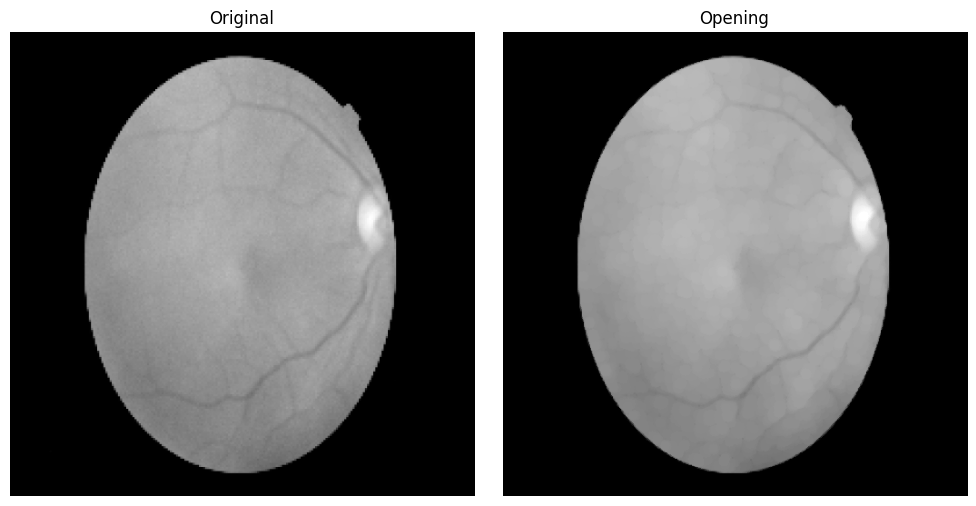

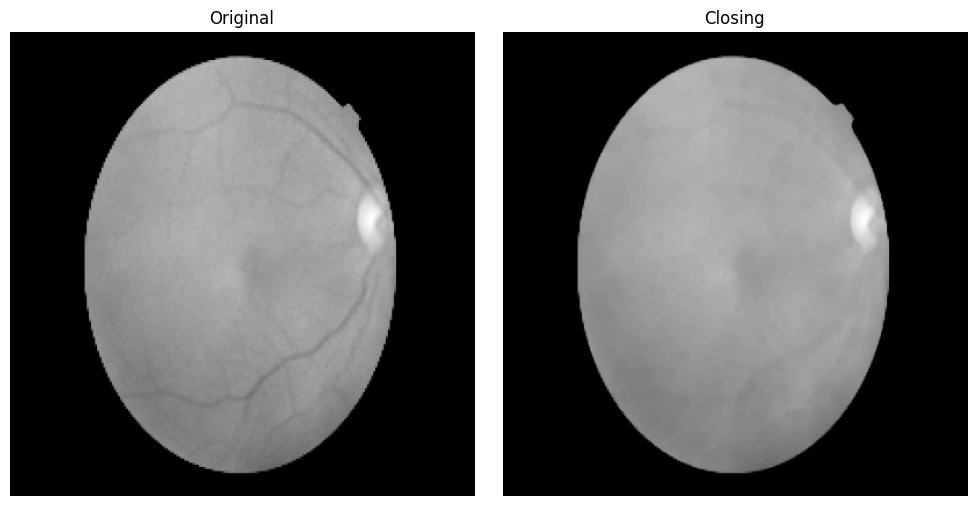


2. Advanced Morphological Operations:


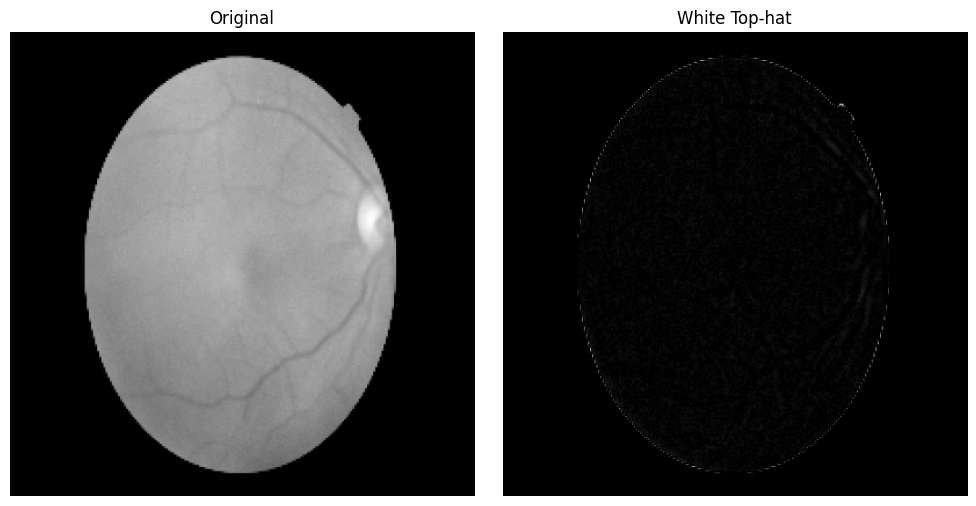

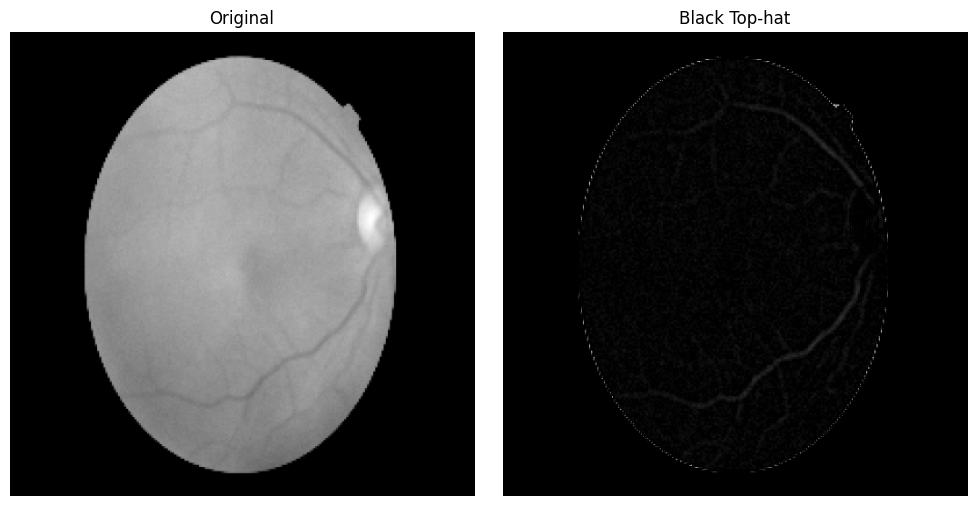

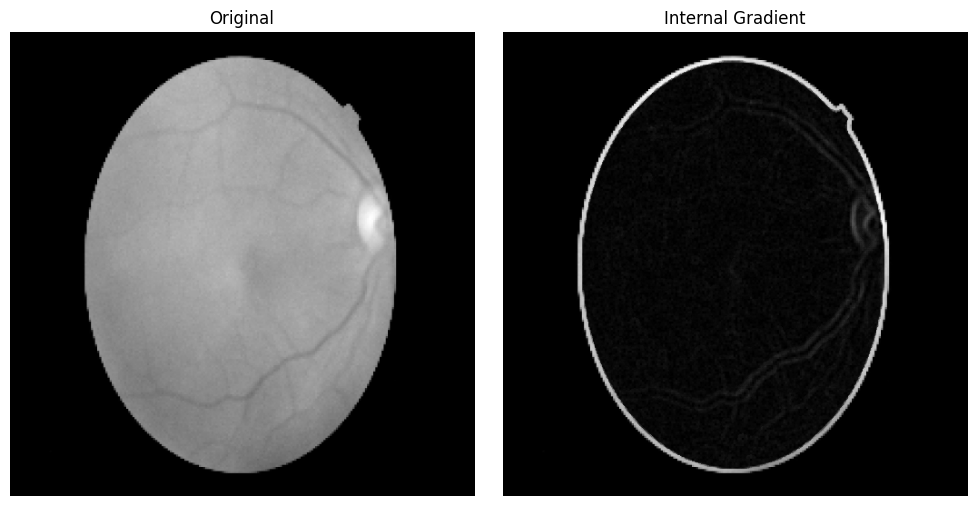

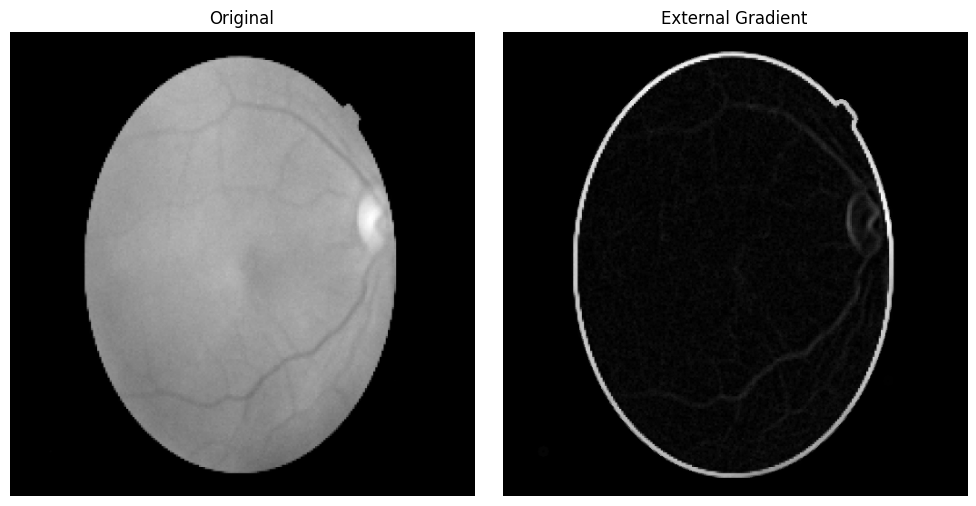

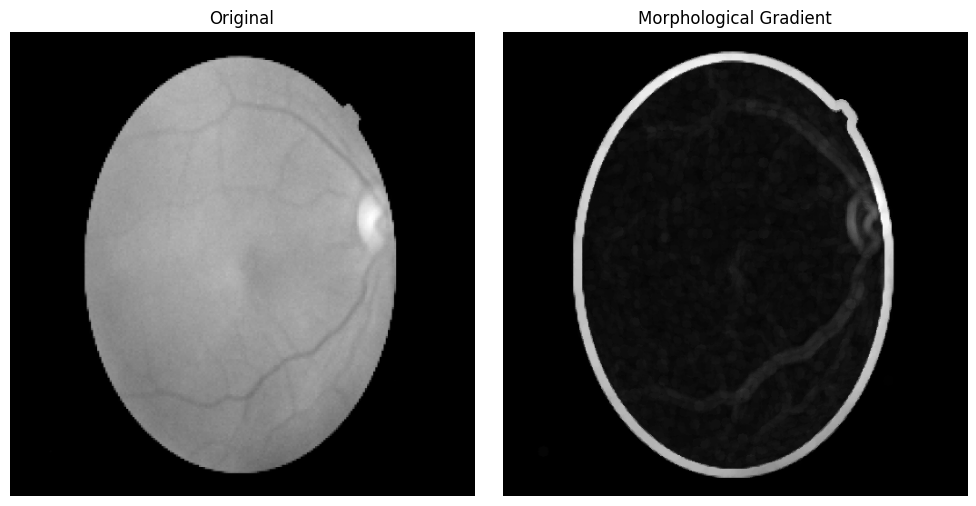

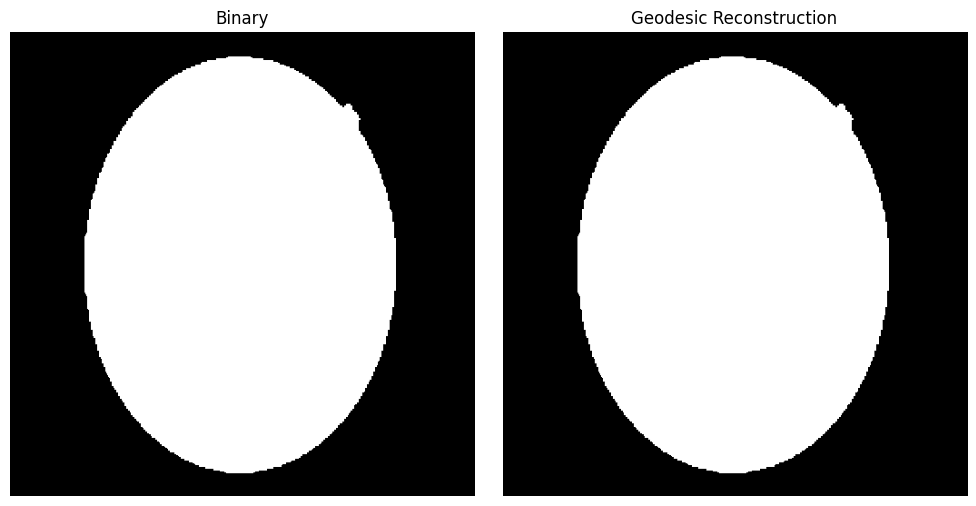

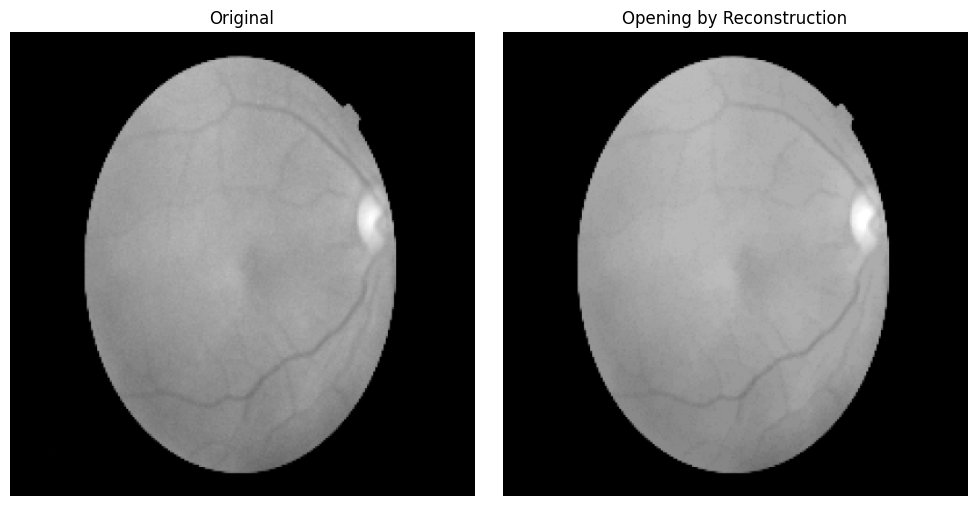

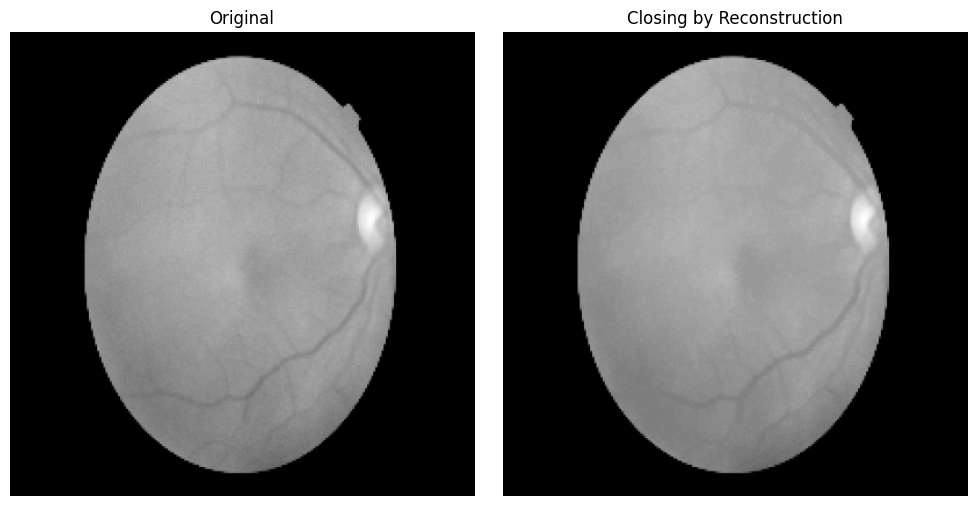

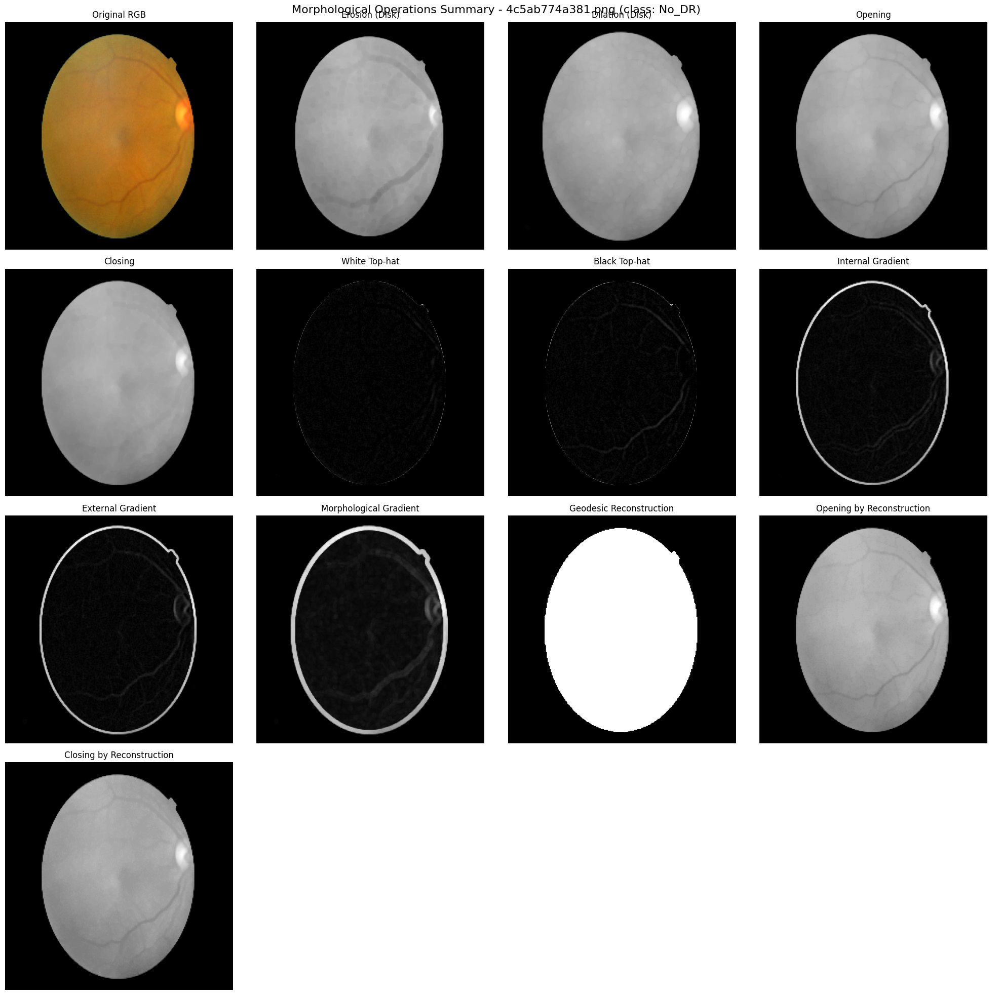


Processing complete for this image.


In [ ]:
# Run operations on sample images
print("Applying morphological operations to sample images...")
for idx, (img_rgb, lbl, fname) in enumerate(demo10[:2]):  # Process first 2 images
    print(f"\n=== Processing image {idx+1}: {fname} (class: {lbl}) ===")
    
    print("\n1. Basic Morphological Operations:")
    basic_results = apply_basic_operations(img_rgb)
    
    print("\n2. Advanced Morphological Operations:")
    advanced_results = apply_advanced_operations(img_rgb)
    
    # Show all results in a summary grid
    fig, axs = plt.subplots(4, 4, figsize=(20, 20))
    axs = axs.ravel()
    
    # Original
    axs[0].imshow(img_rgb)
    axs[0].set_title('Original RGB')
    
    # Basic operations
    axs[1].imshow(basic_results['eroded_disk'], cmap='gray')
    axs[1].set_title('Erosion (Disk)')
    
    axs[2].imshow(basic_results['dilated_disk'], cmap='gray')
    axs[2].set_title('Dilation (Disk)')
    
    axs[3].imshow(basic_results['opened'], cmap='gray')
    axs[3].set_title('Opening')
    
    axs[4].imshow(basic_results['closed'], cmap='gray')
    axs[4].set_title('Closing')
    
    # Advanced operations
    axs[5].imshow(advanced_results['white_tophat'], cmap='gray')
    axs[5].set_title('White Top-hat')
    
    axs[6].imshow(advanced_results['black_tophat'], cmap='gray')
    axs[6].set_title('Black Top-hat')
    
    axs[7].imshow(advanced_results['internal_gradient'], cmap='gray')
    axs[7].set_title('Internal Gradient')
    
    axs[8].imshow(advanced_results['external_gradient'], cmap='gray')
    axs[8].set_title('External Gradient')
    
    axs[9].imshow(advanced_results['morph_gradient'], cmap='gray')
    axs[9].set_title('Morphological Gradient')
    
    axs[10].imshow(advanced_results['reconstructed'], cmap='gray')
    axs[10].set_title('Geodesic Reconstruction')
    
    axs[11].imshow(advanced_results['opening_by_reconstruction'], cmap='gray')
    axs[11].set_title('Opening by Reconstruction')
    
    axs[12].imshow(advanced_results['closing_by_reconstruction'], cmap='gray')
    axs[12].set_title('Closing by Reconstruction')
    
    # Turn off axes
    for ax in axs:
        ax.axis('off')
    
    plt.suptitle(f"Morphological Operations Summary - {fname} (class: {lbl})", fontsize=16)
    plt.tight_layout()
    plt.show()
    
    print("\nProcessing complete for this image.")